# import modules

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import qgrid

C:\Users\Raz\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Raz\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Raz\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Raz\AppData\Roaming\Python\Python37\site-packages

In [2]:
from keras.preprocessing import image

Using TensorFlow backend.


In [18]:
try:

    import tensorflow as tf
    import cv2
    import os
    import pickle
    import numpy as np
    print("Library Loaded Successfully ..........")
except:
    print("Library not Found ! ")


class MasterImage(object):

    def __init__(self,PATH='', IMAGE_SIZE = 50):
        self.PATH = PATH
        self.IMAGE_SIZE = IMAGE_SIZE

        self.image_data = []
        self.x_data = []
        self.y_data = []
        self.CATEGORIES = []

        # This will get List of categories
        self.list_categories = []

    def get_categories(self):
        for path in os.listdir(self.PATH):
            if '.DS_Store' in path:
                pass
            else:
                self.list_categories.append(path)
        print("Found Categories ",self.list_categories,'\n')
        return self.list_categories

    def Process_Image(self):
        try:
            """
            Return Numpy array of image
            :return: X_Data, Y_Data
            """
            self.CATEGORIES = self.get_categories()
            for categories in self.CATEGORIES:                                                  # Iterate over categories

                train_folder_path = os.path.join(self.PATH, categories)                         # Folder Path
                class_index = self.CATEGORIES.index(categories)                                 # this will get index for classification

                for img in os.listdir(train_folder_path):                                       # This will iterate in the Folder
                    new_path = os.path.join(train_folder_path, img)                             # image Path

                    try:        # if any image is corrupted
                        image_data_temp = cv2.imread(new_path,cv2.IMREAD_GRAYSCALE)                 # Read Image as numbers
                        image_temp_resize = cv2.resize(image_data_temp,(self.IMAGE_SIZE,self.IMAGE_SIZE))
                        self.image_data.append([image_temp_resize,class_index])
                    except:
                        pass

            data = np.asanyarray(self.image_data)

            # Iterate over the Data
            for x in data:
                self.x_data.append(x[0])        # Get the X_Data
                self.y_data.append(x[1])        # get the label

            X_Data = np.asarray(self.x_data) / (255.0)      # Normalize Data
            Y_Data = np.asarray(self.y_data)

            return X_Data,Y_Data
        except:
            print("Failed to run Function Process Image ")

    def pickle_image(self):

        """
        :return: None Creates a Pickle Object of DataSet
        """

        X_Data,Y_Data = self.Process_Image()

        pickle_out = open('X_Data','wb')
        pickle.dump(X_Data, pickle_out)
        pickle_out.close()

        pickle_out = open('Y_Data', 'wb')
        pickle.dump(Y_Data, pickle_out)
        pickle_out.close()

        print("Pickled Image Successfully ")

        return X_Data,Y_Data

    def load_dataset(self):

        try:
            X_Temp = open('X_Data','rb')
            X_Data = pickle.load(X_Temp)

            Y_Temp = open('Y_Data','rb')
            Y_Data = pickle.load(Y_Temp)

            print('Reading Dataset from PIckle Object')

            return X_Data,Y_Data

        except:
            print('Could not Found Pickle File ')
            print('Loading File and Dataset  ..........')

            X_Data,Y_Data = self.pickle_image()
            return X_Data,Y_Data


if __name__ == "__main__":
    a = MasterImage(PATH='C:/Users/Raz/Desktop/machinehack/Data/Train',
                    IMAGE_SIZE=80)

    X_Data,Y_Data = a.load_dataset()
    print(X_Data.shape)

Library Loaded Successfully ..........
Reading Dataset from PIckle Object
(9471, 80, 80)


In [14]:
from sklearn.model_selection import train_test_split

In [19]:
X_Data = X_Data.reshape(-1,80,80,1)

In [15]:
x_train, x_test, y_train, y_test = train_test_split(X_Data, Y_Data, test_size=0.33, random_state=42)

In [16]:
x_train = x_train.reshape(-1,80,80,1)
x_test = x_test.reshape(-1,80,80,1)

# Convonutional nural network

In [5]:
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Dropout

In [6]:
model = Sequential()
cnn_classifier = Sequential()

In [7]:
cnn_classifier.add(Conv2D(64,(3,3),input_shape = (80,80,1),activation ='relu'))
cnn_classifier.add(MaxPooling2D(pool_size = (2,2)))
cnn_classifier.add(Dropout(.4))
cnn_classifier.add(Conv2D(64,(3,3),activation  = 'relu'))
cnn_classifier.add(MaxPooling2D(pool_size = (2,2)))
cnn_classifier.add(Dropout(.4))
cnn_classifier.add(Conv2D(32,(3,3),activation  = 'relu'))
cnn_classifier.add(MaxPooling2D(pool_size = (2,2)))
cnn_classifier.add(Dropout(.4))
cnn_classifier.add(Flatten())
cnn_classifier.add(Dense(units = 256,activation = 'relu'))
cnn_classifier.add(Dense(units =128 ,activation=  'relu'))
cnn_classifier.add(Dense(units =32 ,activation=  'relu'))
cnn_classifier.add(Dense(units = 1,activation=  'sigmoid'))
cnn_classifier.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])


W0715 15:37:58.306339  4076 deprecation_wrapper.py:119] From C:\Users\Raz\anaconda3\envs\deeplearning\lib\site-packages\keras\backend\tensorflow_backend.py:4070: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W0715 15:37:58.512456  4076 deprecation.py:323] From C:\Users\Raz\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\ops\nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [8]:
cnn_classifier.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 78, 78, 64)        640       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 39, 39, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 39, 39, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 37, 37, 64)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 18, 18, 64)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 18, 18, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 32)       

In [21]:
cnn_classifier.fit(x_train,y_train,batch_size = 20, epochs=30,validation_split=0.2
                  )

Train on 5076 samples, validate on 1269 samples
Epoch 1/30
5076/5076 [==============================] - 67s 13ms/step - loss: 0.6716 - accuracy: 0.5887 - val_loss: 0.6551 - val_accuracy: 0.6367
Epoch 2/30
5076/5076 [==============================] - 68s 13ms/step - loss: 0.6481 - accuracy: 0.6316 - val_loss: 0.6301 - val_accuracy: 0.6493
Epoch 3/30
5076/5076 [==============================] - 67s 13ms/step - loss: 0.6223 - accuracy: 0.6545 - val_loss: 0.6060 - val_accuracy: 0.6753
Epoch 4/30
5076/5076 [==============================] - 68s 13ms/step - loss: 0.5795 - accuracy: 0.6935 - val_loss: 0.5743 - val_accuracy: 0.7013
Epoch 5/30
5076/5076 [==============================] - 69s 14ms/step - loss: 0.5713 - accuracy: 0.7027 - val_loss: 0.5521 - val_accuracy: 0.7242
Epoch 6/30
5076/5076 [==============================] - 68s 13ms/step - loss: 0.5352 - accuracy: 0.7238 - val_loss: 0.5420 - val_accuracy: 0.7407
Epoch 7/30
5076/5076 [==============================] - 68s 13ms/step - loss

# Prediction

In [22]:
d = {}
dir_path = 'C:/Users/Raz/Desktop/machinehack/Data/test/Test'
for i in os.listdir(dir_path):
    img = image.load_img(dir_path+'//'+i,target_size=(80,80),grayscale = True)
    x = image.img_to_array(img)
    x = np.expand_dims(x,axis = 0)
    images = np.vstack([x])
    val = cnn_classifier.predict(images)
    if val> .5:
        val = 1
    else:
        val = 0
    d[i] = val
    
    


C:\Users\Raz\AppData\Roaming\Python\Python37\site-packages\keras_preprocessing\image\utils.py:104: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '


# Result

C:\Users\Raz\AppData\Roaming\Python\Python37\site-packages\keras_preprocessing\image\utils.py:104: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '


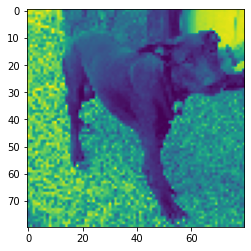

Dog


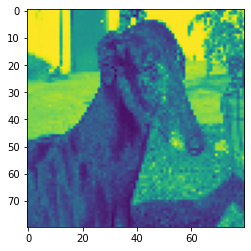

cat


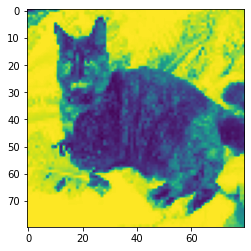

cat


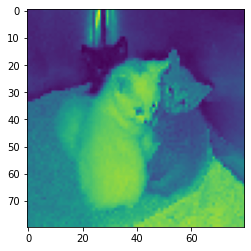

Dog


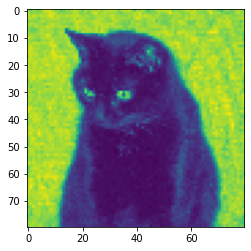

Dog


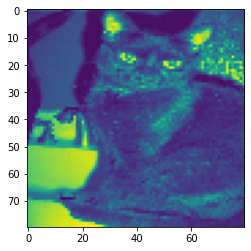

cat


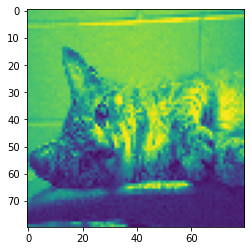

cat


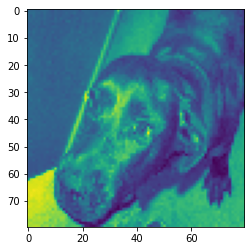

cat


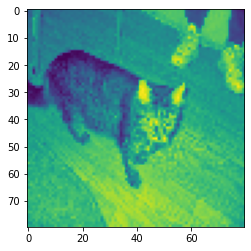

cat


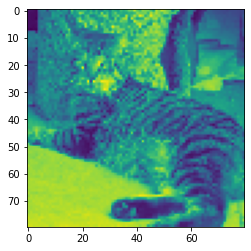

cat


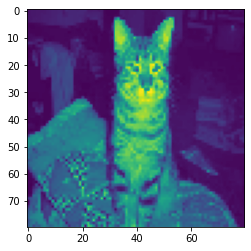

cat


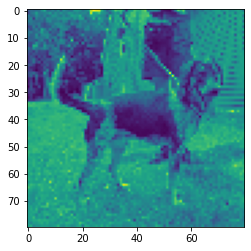

Dog


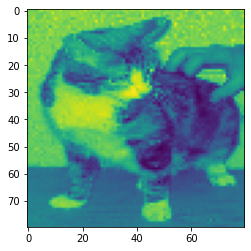

cat


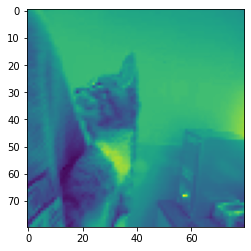

Dog


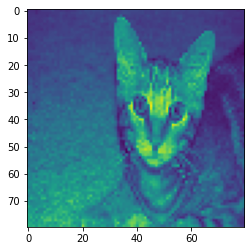

cat


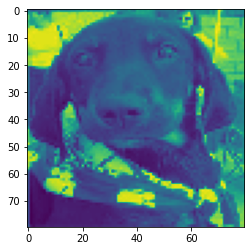

Dog


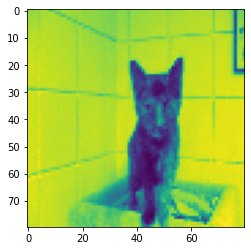

Dog


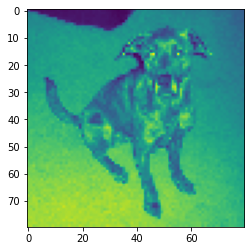

cat


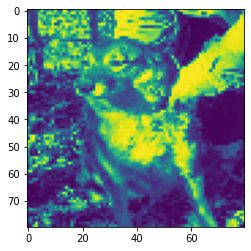

Dog


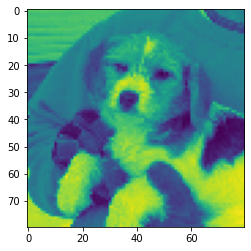

Dog


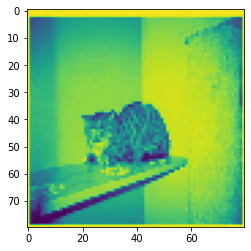

Dog


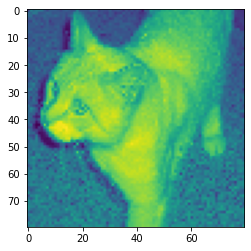

Dog


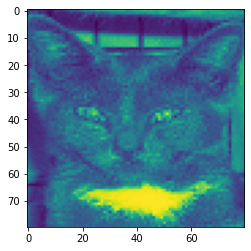

cat


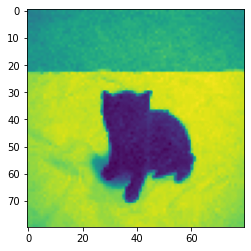

Dog


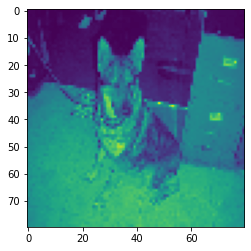

cat


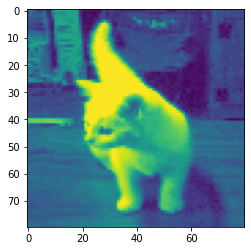

Dog


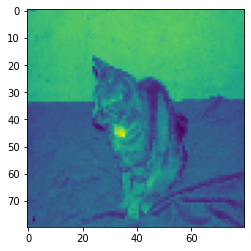

Dog


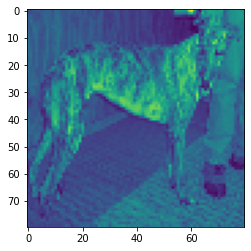

cat


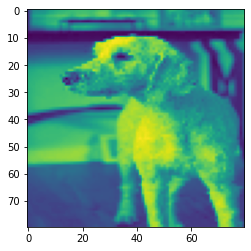

Dog


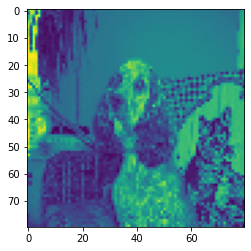

cat


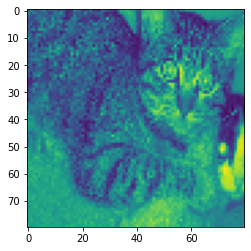

cat


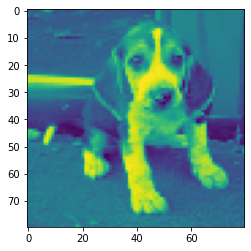

Dog


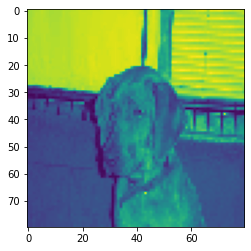

Dog


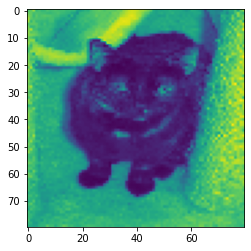

Dog


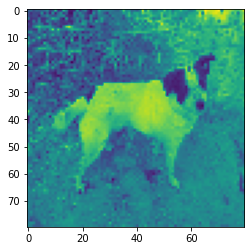

Dog


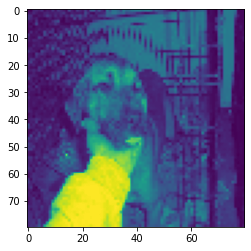

cat


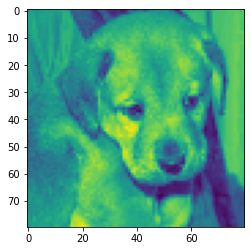

cat


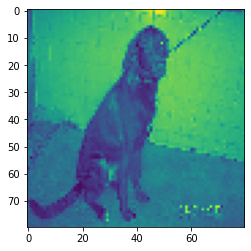

Dog


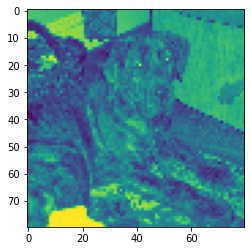

cat


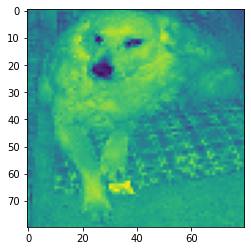

cat


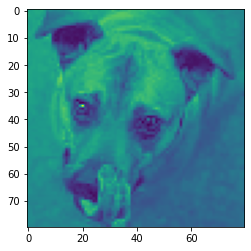

Dog


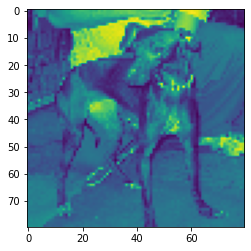

Dog


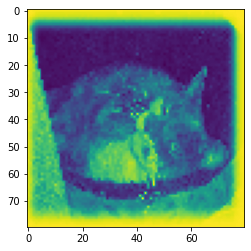

cat


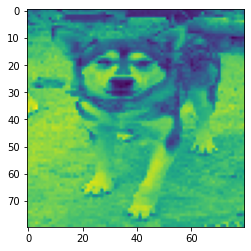

cat


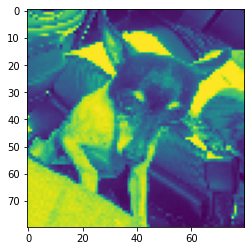

Dog


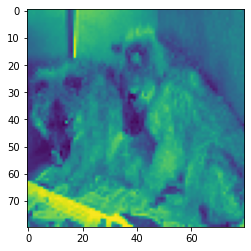

cat


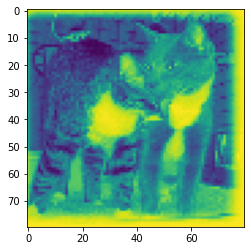

cat


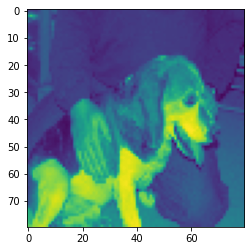

Dog


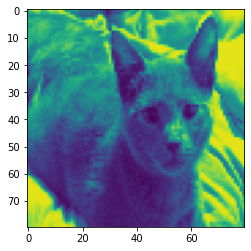

cat


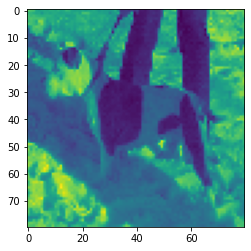

cat


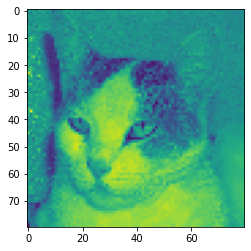

cat


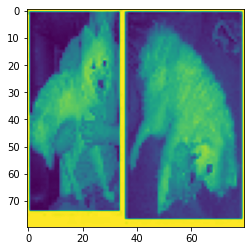

cat


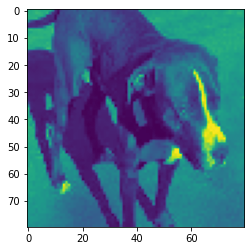

Dog


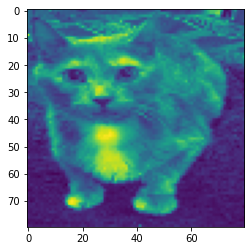

cat


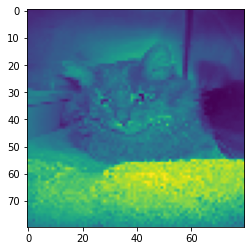

cat


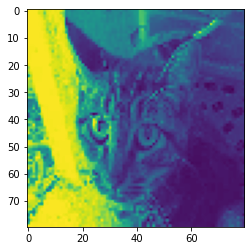

cat


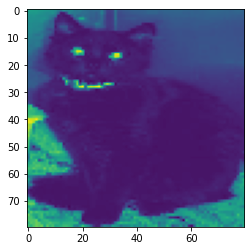

cat


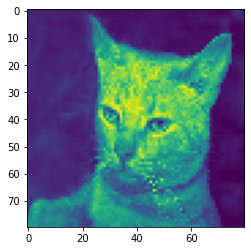

cat


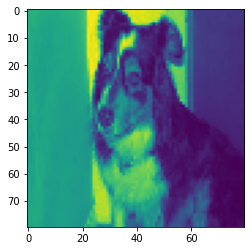

cat


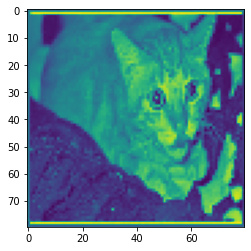

cat


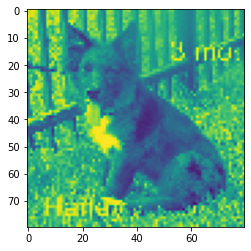

cat


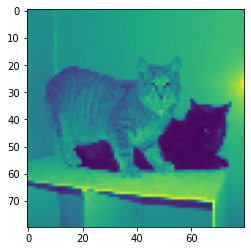

cat


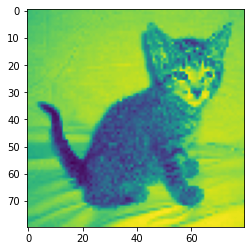

cat


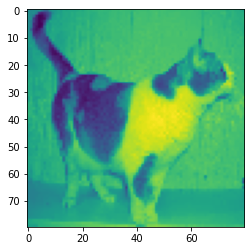

Dog


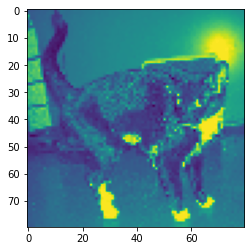

Dog


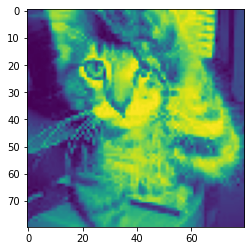

cat


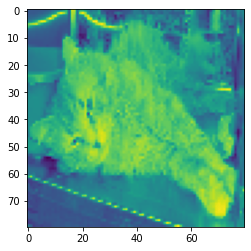

cat


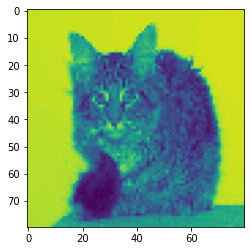

Dog


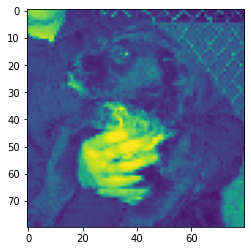

Dog


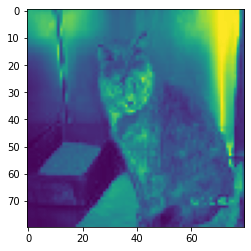

cat


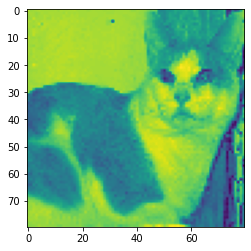

cat


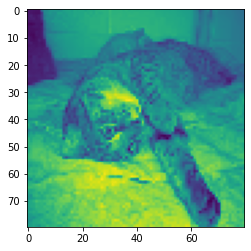

cat


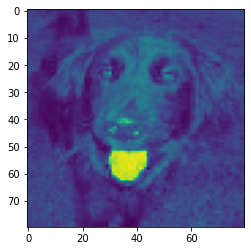

Dog


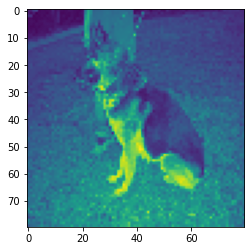

Dog


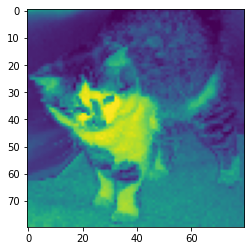

cat


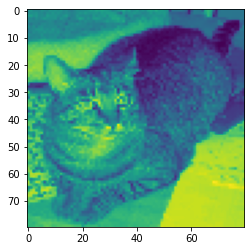

cat


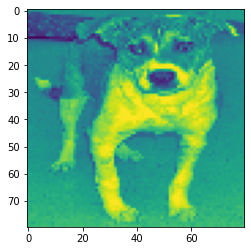

Dog


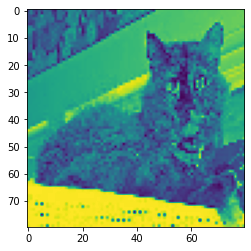

cat


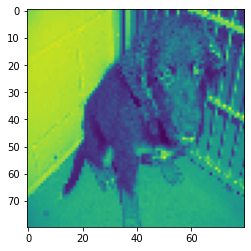

Dog


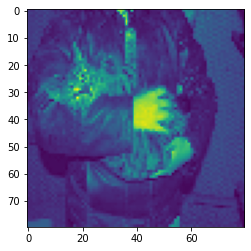

cat


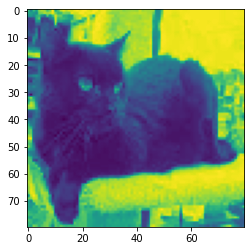

cat


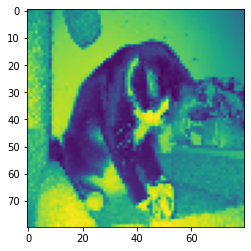

Dog


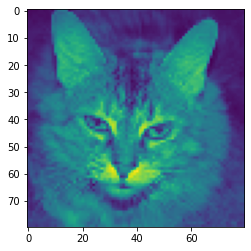

cat


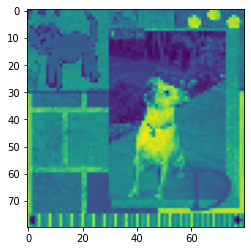

cat


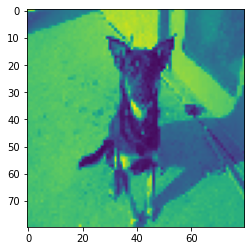

Dog


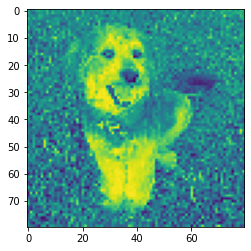

cat


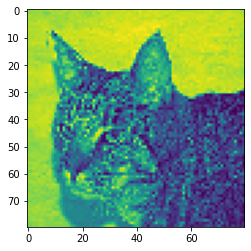

Dog


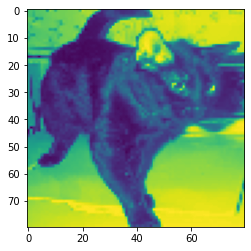

cat


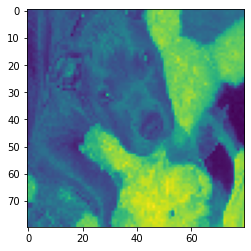

Dog


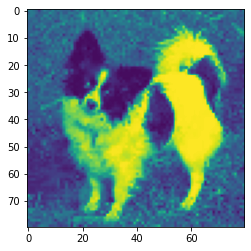

Dog


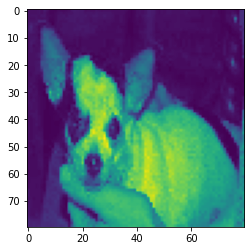

Dog


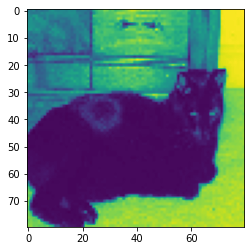

cat


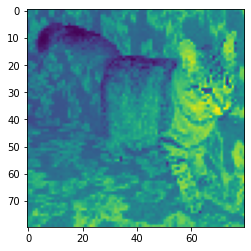

cat


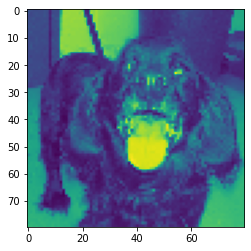

cat


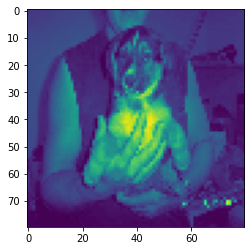

cat


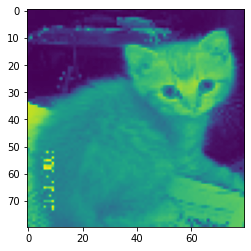

cat


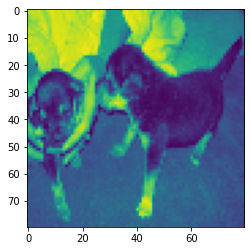

Dog


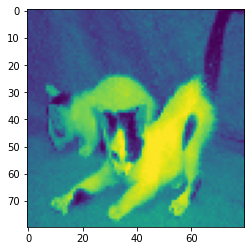

Dog


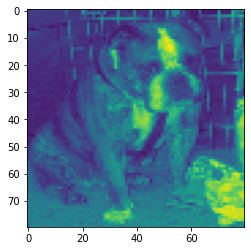

cat


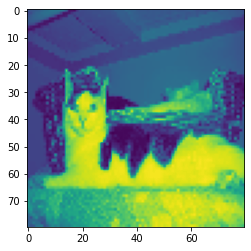

Dog


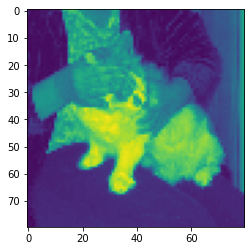

cat


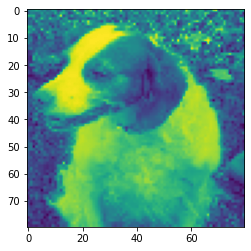

cat


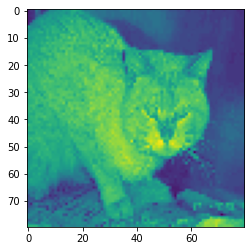

Dog


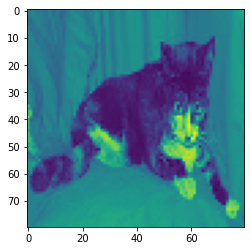

cat


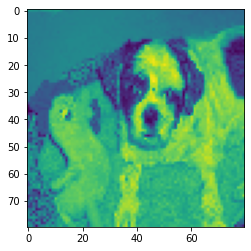

Dog


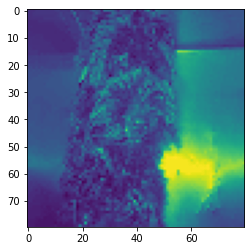

Dog


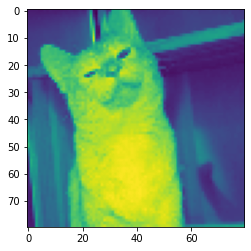

Dog


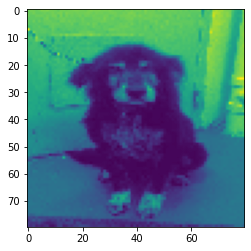

Dog


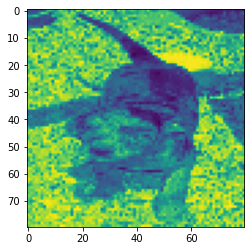

Dog


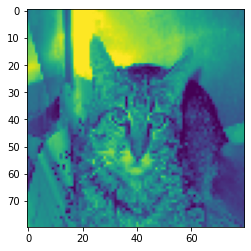

cat


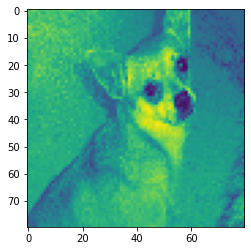

Dog


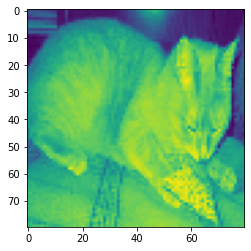

Dog


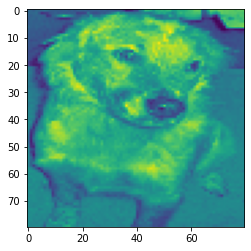

cat


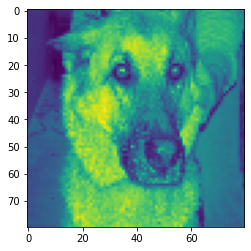

cat


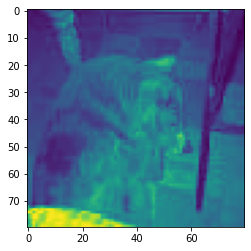

cat


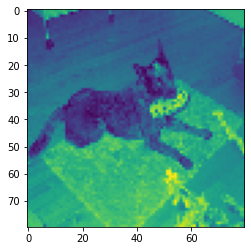

Dog


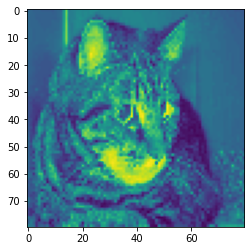

cat


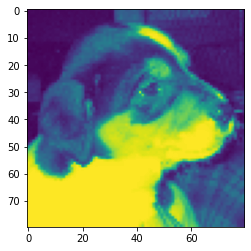

Dog


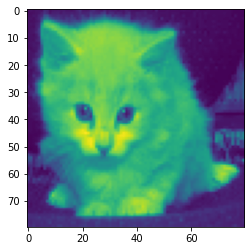

cat


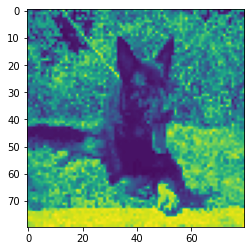

Dog


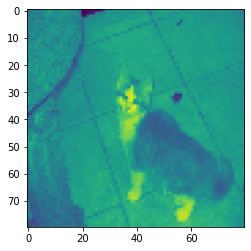

Dog


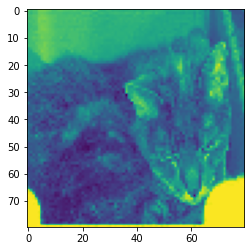

cat


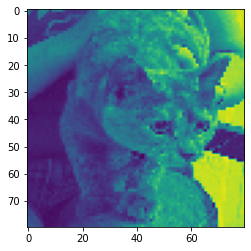

cat


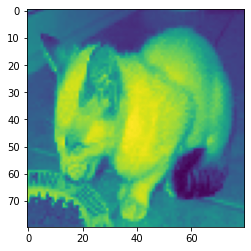

Dog


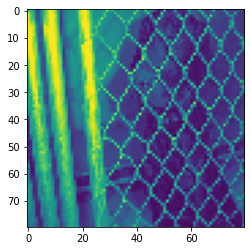

Dog


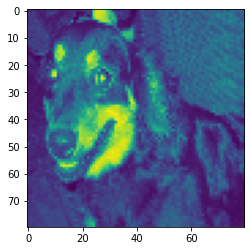

cat


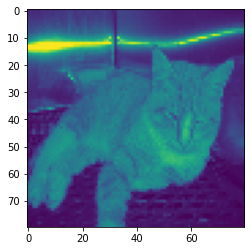

cat


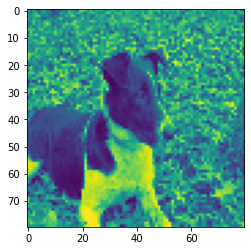

Dog


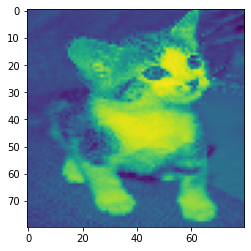

Dog


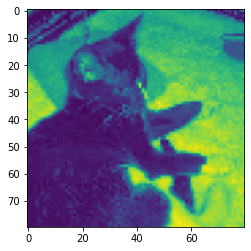

Dog


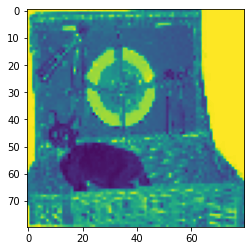

cat


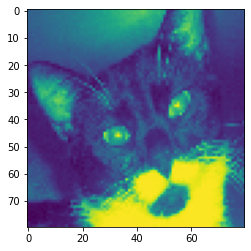

Dog


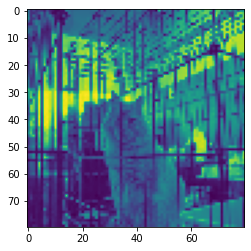

cat


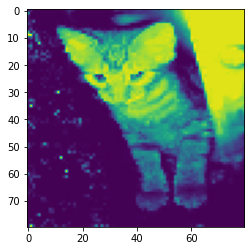

Dog


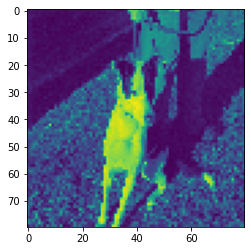

Dog


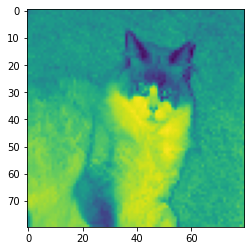

cat


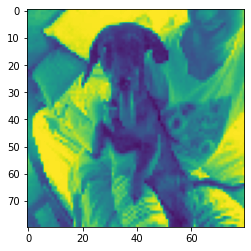

Dog


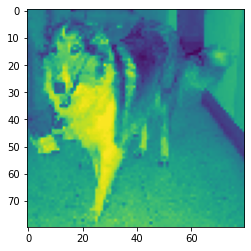

cat


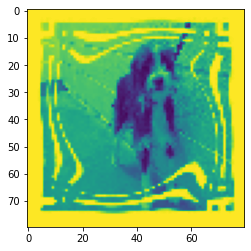

Dog


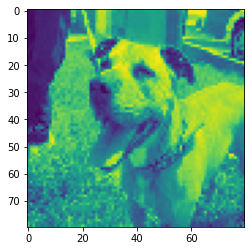

Dog


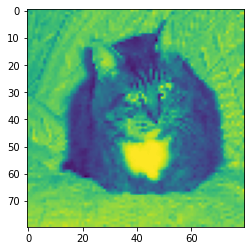

cat


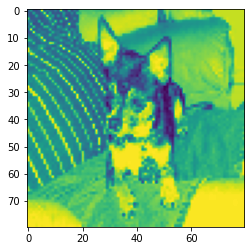

cat


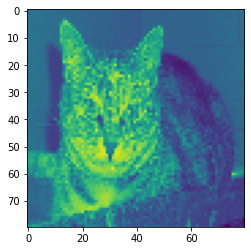

cat


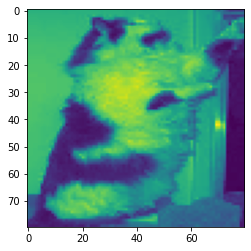

cat


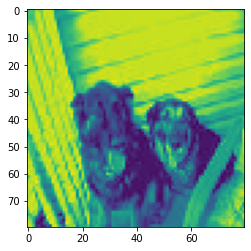

Dog


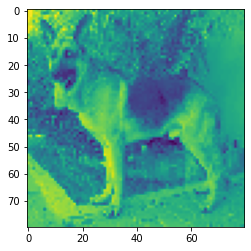

Dog


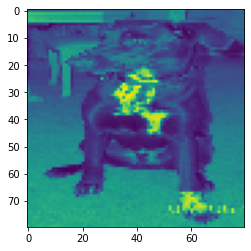

Dog


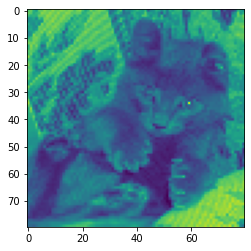

cat


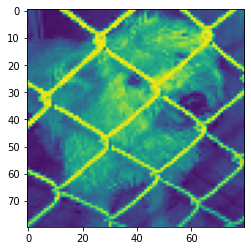

Dog


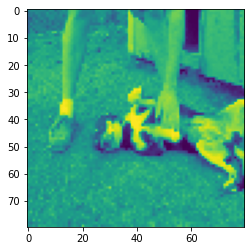

Dog


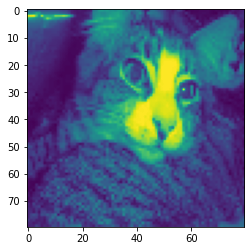

cat


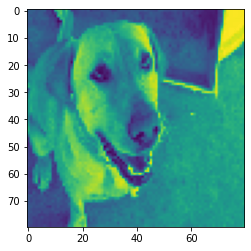

Dog


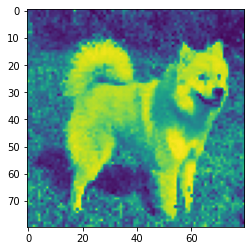

Dog


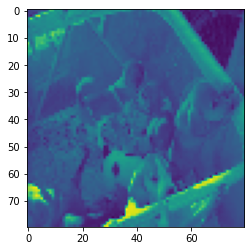

Dog


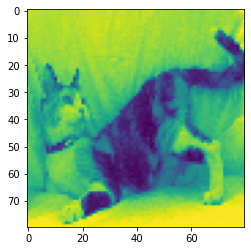

cat


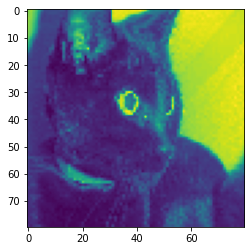

In [ ]:

dir_path = 'C:/Users/Raz/Desktop/machinehack/Data/test/Test'
for i in os.listdir(dir_path):
    img = image.load_img(dir_path+'//'+i,target_size=(80,80),grayscale = True)
    plt.imshow(img)
    plt.show()
    x = image.img_to_array(img)
    x = np.expand_dims(x,axis = 0)
    images = np.vstack([x])
    val = cnn_classifier.predict(images)
    if val> .5:
        print('Dog')
    else:
        print('cat')
    
    

    